This notebook can be used to convert Labelbox export files to COCO format annotation. To learn more about how to annotate image through Labelbox, please visit their official <a href="https://labelbox.com/product/annotate/"> website </a>.  To understand what COCO format is, please visit  <a href="https://cocodataset.org/#format-data">  this page </a>.

### Imports

In [1]:
import os
import sys
import cv2
import matplotlib.pyplot as plt
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer

# define paths
sys.path.append("..")
from src.labelbox_processing import labelbox_to_coco

/u/h/u/huanga/miniconda3/envs/drone_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### TODO

In [ ]:
# fill in the path on your machine
label_box_folder = "/data/huanga/Synchrony/label_box" # where you saved the raw labelbox json file
annotations_folder = "/data/huanga/Synchrony/annotations" # where you want to save the annotations from labelbox
extracted_frames_folder = "/data/huanga/Synchrony/annotations/annotated_images" # where you want to save the annotated frames from labelbox


# create folders if they don't exist
os.makedirs(label_box_folder, exist_ok=True)
os.makedirs(annotations_folder, exist_ok=True)
os.makedirs(extracted_frames_folder, exist_ok=True)

### Generate file names

In [7]:
# get the list of labelbox json files that you want to process
file_names = [file_name for file_name in os.listdir(label_box_folder) if ".json" in file_name]
export_files =  [os.path.join(label_box_folder, name) for name in file_names]
coco_files = [os.path.join(annotations_folder, f"coco_drone_{name}") for name in file_names]

# Info to include in the coco annotation file being created
dataset_description = "drone_footage"
dataset_date = "May.12.2023"

### Generate COCO foramt dataset

In [10]:
# get the classes from the labelbox json file
def get_classes(ann):
    if 'classifications' not in ann.keys():
        return ann['value']
    for feature in ann['classifications']:
        if feature['title'] == 'status':
            if feature['answer']['value'] == 'adult_male':
                return feature['answer']['value']
            else:
                return ann['value']
            
# Save the images and created coco format json file that corresponds to the labelbox.json file being used
for export_file, coco_file in zip(export_files, coco_files):
    labelbox_to_coco(export_file, 
        coco_file,
        extracted_frames_folder, 
        description=dataset_description, 
        date=dataset_date,
        overwrite=False, 
        verbose=True,
        custom_class_reader=get_classes
    )   

1 band_member
2 object_e_g_backpacks_belongings
saving at /home/whuang288/data/annotations2/coco_drone_export-2023-05-28T22_54_09.852Z.json
10273 annotations from 23 images saved.
1 band_member
2 object_e_g_backpacks_belongings
3 observer_non_band_member
saving at /home/whuang288/data/annotations2/coco_drone_export-2023-05-28T22_57_15.599Z.json
3860 annotations from 12 images saved.
1 band_member
2 object_e_g_backpacks_belongings
saving at /home/whuang288/data/annotations2/coco_drone_export-2023-05-28T22_52_44.411Z.json
16805 annotations from 32 images saved.
1 band_member
2 object_e_g_backpacks_belongings
3 observer_non_band_member
saving at /home/whuang288/data/annotations2/coco_drone_export-2023-05-28T22_51_04.704Z.json
11562 annotations from 32 images saved.
1 band_member
2 object_e_g_backpacks_belongings
saving at /home/whuang288/data/annotations2/coco_drone_export-2023-05-28T22_54_52.134Z.json
12432 annotations from 32 images saved.
1 band_member
2 object_e_g_backpacks_belongings

### Visualize annotations

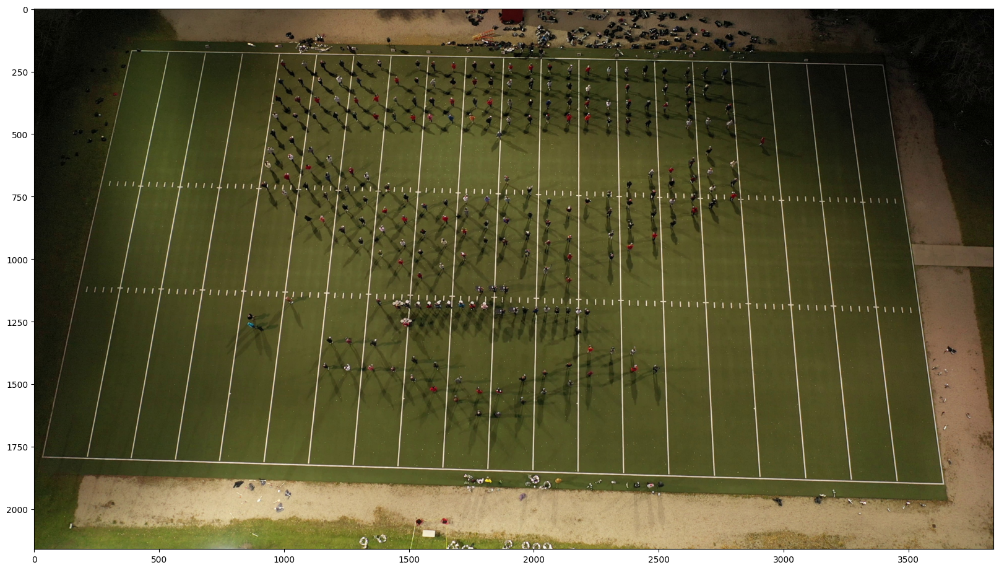

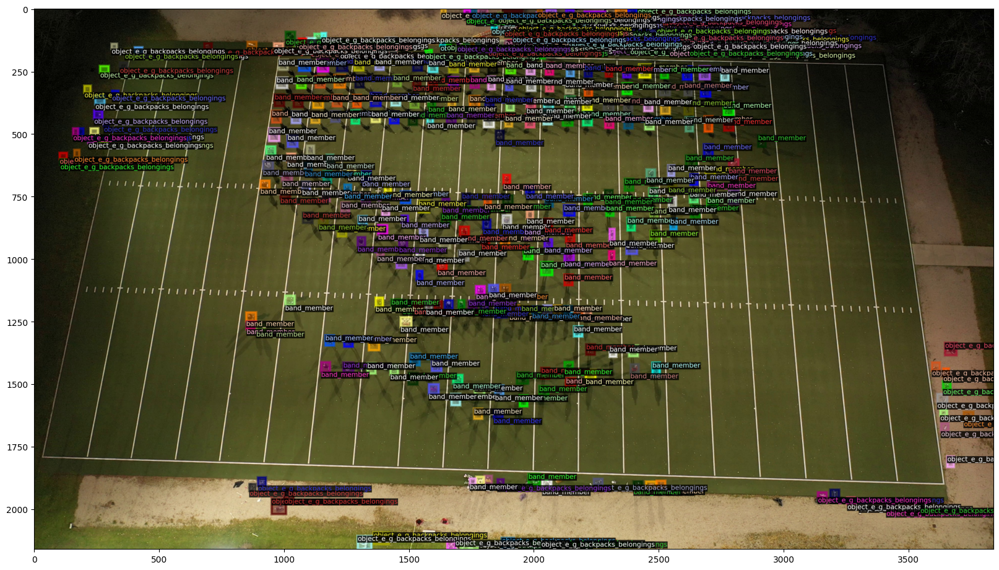

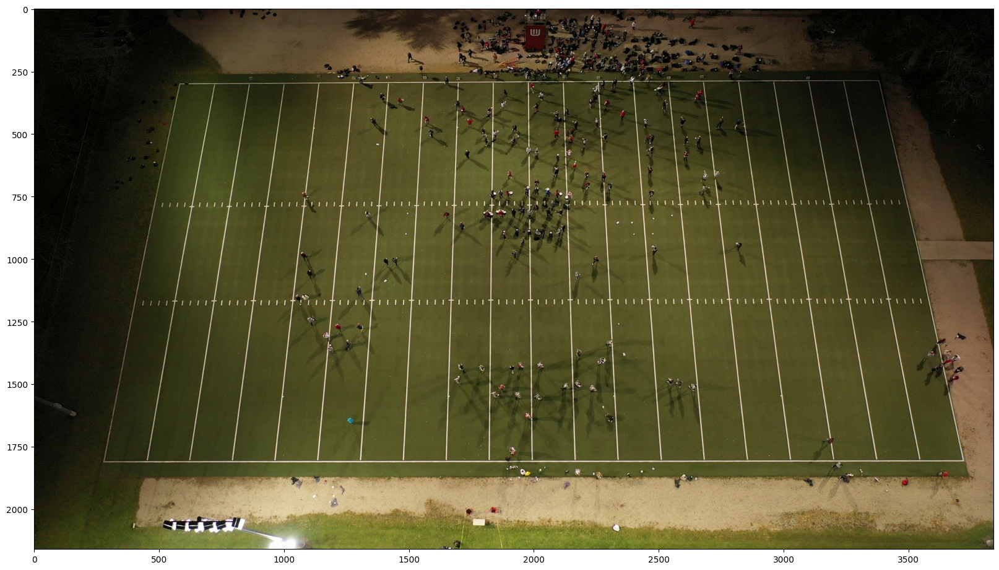

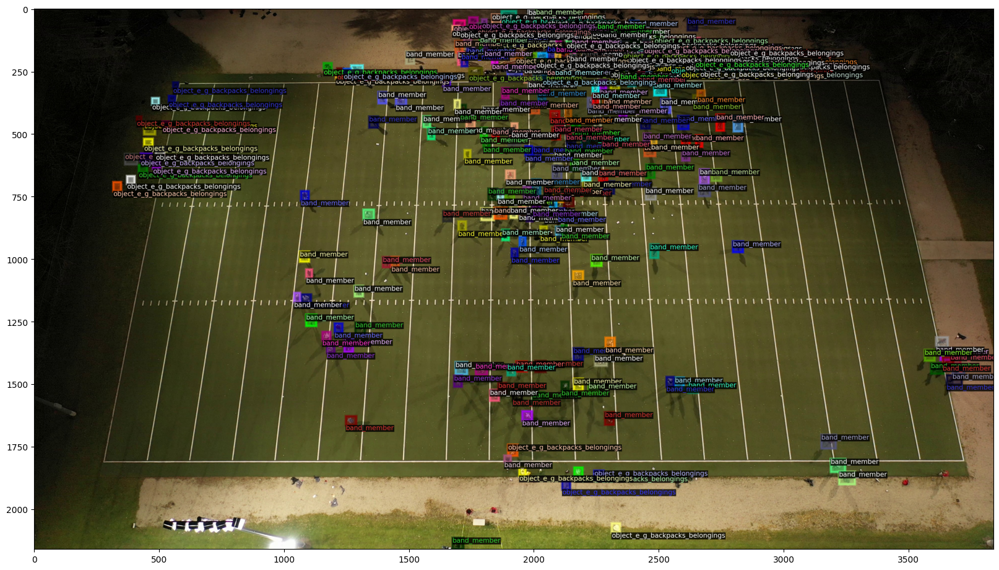

In [13]:
register_coco_instances("visualize", {}, coco_files[0], extracted_frames_folder)
data_metadata = MetadataCatalog.get("visualize")
data_dicts = DatasetCatalog.get("visualize")

for d in data_dicts[:2]:
    # show original image
    img = cv2.imread(d["file_name"])
    plt.figure(figsize=(20, 20))
    plt.imshow(img[..., ::-1])
    
    # show annotated image
    visualizer = Visualizer(img[:, :, ::-1], metadata=data_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(20, 20))
    plt.imshow(vis.get_image())